# Importing Libraries

In [1]:
#Importing Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import os
import folium
from folium.plugins import HeatMap
import json
import geopy
import geopandas as gpd

# Importing Data

In [2]:
#Defininf Path
path=r'/Users/guillaumemac/Achievement 6'

In [3]:
# Importing ".json" file for the U.S.
country_geo =r'/Users/guillaumemac/Achievement 6/02 Data/Practice/us-states.json'

In [4]:
country_geo

'/Users/guillaumemac/Achievement 6/02 Data/Practice/us-states.json'

In [5]:
#Looking at the JSON file contents
f = open(r'/Users/guillaumemac/Achievement 6/02 Data/Practice/us-states.json')
# returns JSON object asa dictionary
data = json.load(f)  
# Iterating through the json list
for i in data['features']:
    print(i)

{'type': 'Feature', 'id': 'AL', 'properties': {'name': 'Alabama'}, 'geometry': {'type': 'Polygon', 'coordinates': [[[-87.359296, 35.00118], [-85.606675, 34.984749], [-85.431413, 34.124869], [-85.184951, 32.859696], [-85.069935, 32.580372], [-84.960397, 32.421541], [-85.004212, 32.322956], [-84.889196, 32.262709], [-85.058981, 32.13674], [-85.053504, 32.01077], [-85.141136, 31.840985], [-85.042551, 31.539753], [-85.113751, 31.27686], [-85.004212, 31.003013], [-85.497137, 30.997536], [-87.600282, 30.997536], [-87.633143, 30.86609], [-87.408589, 30.674397], [-87.446927, 30.510088], [-87.37025, 30.427934], [-87.518128, 30.280057], [-87.655051, 30.247195], [-87.90699, 30.411504], [-87.934375, 30.657966], [-88.011052, 30.685351], [-88.10416, 30.499135], [-88.137022, 30.318396], [-88.394438, 30.367688], [-88.471115, 31.895754], [-88.241084, 33.796253], [-88.098683, 34.891641], [-88.202745, 34.995703], [-87.359296, 35.00118]]]}}
{'type': 'Feature', 'id': 'AK', 'properties': {'name': 'Alaska'},

In [6]:
#Importing the citibike dataframe
citibike=pd.read_csv(os.path.join(path,'02 Data','Prepared Data','citibike_clean.csv'))

In [7]:
#Viewing the data
citibike.head()

,Unnamed: 0,day_of_the_week,start_hour,ride_start_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,ride_end_time,end_station_id,end_station_name,end_station_latitude,end_station_longitude,trip_duration,subscriber,birth_year,gender
0,0,Mon,18,2013-09-09 18:18:55,523,W 38 St & 8 Ave,40.754666,-73.991382,2013-09-09 18:35:28,334,W 20 St & 7 Ave,40.742388,-73.997262,993,Subscriber,1968,Female
1,1,Thu,18,2013-09-12 18:38:53,257,Lispenard St & Broadway,40.719392,-74.002472,2013-09-12 18:48:34,236,St Marks Pl & 2 Ave,40.728419,-73.987140,581,Subscriber,1983,Male
2,2,Wed,19,2013-09-18 19:44:04,479,9 Ave & W 45 St,40.760193,-73.991255,2013-09-18 19:50:05,513,W 56 St & 10 Ave,40.768254,-73.988639,361,Subscriber,1989,Male
3,3,Sat,11,2013-09-28 11:54:37,527,E 33 St & 1 Ave,40.743156,-73.974347,2013-09-28 12:03:58,441,E 52 St & 2 Ave,40.756014,-73.967416,561,Subscriber,1988,Female
4,5,Fri,22,2013-09-27 22:01:01,293,Lafayette St & E 8 St,40.730287,-73.990765,2013-09-27 22:08:08,432,E 7 St & Avenue A,40.726218,-73.983799,427,Subscriber,1986,Female


# 5.Data Wrangling

In [8]:
#Create a function to convert trip duration to minutes
def time_convert(secs):
  days = secs//86400
  hours = (secs - days*86400)//3600
  mins = (secs - days*86400 - hours*3600)//60
  return mins

In [9]:
#Applying the function to the Trip Duration Column
citibike['trip_duration_min'] = citibike['trip_duration'].apply(time_convert)

In [10]:
citibike.head()

,Unnamed: 0,day_of_the_week,start_hour,ride_start_time,start_station_id,start_station_name,start_station_latitude,start_station_longitude,ride_end_time,end_station_id,end_station_name,end_station_latitude,end_station_longitude,trip_duration,subscriber,birth_year,gender,trip_duration_min
0,0,Mon,18,2013-09-09 18:18:55,523,W 38 St & 8 Ave,40.754666,-73.991382,2013-09-09 18:35:28,334,W 20 St & 7 Ave,40.742388,-73.997262,993,Subscriber,1968,Female,16
1,1,Thu,18,2013-09-12 18:38:53,257,Lispenard St & Broadway,40.719392,-74.002472,2013-09-12 18:48:34,236,St Marks Pl & 2 Ave,40.728419,-73.987140,581,Subscriber,1983,Male,9
2,2,Wed,19,2013-09-18 19:44:04,479,9 Ave & W 45 St,40.760193,-73.991255,2013-09-18 19:50:05,513,W 56 St & 10 Ave,40.768254,-73.988639,361,Subscriber,1989,Male,6
3,3,Sat,11,2013-09-28 11:54:37,527,E 33 St & 1 Ave,40.743156,-73.974347,2013-09-28 12:03:58,441,E 52 St & 2 Ave,40.756014,-73.967416,561,Subscriber,1988,Female,9
4,5,Fri,22,2013-09-27 22:01:01,293,Lafayette St & E 8 St,40.730287,-73.990765,2013-09-27 22:08:08,432,E 7 St & Avenue A,40.726218,-73.983799,427,Subscriber,1986,Female,7


In [11]:
#Selecting only the necessary columns.

columns = ["day_of_the_week",
"start_hour","ride_start_time",
"start_station_latitude","start_station_longitude",
"ride_end_time","end_station_latitude",
"end_station_longitude","subscriber","birth_year","gender",
"trip_duration_min"]

In [12]:
# Creating a subset
citibike_geo=citibike[columns]

In [13]:
#checking the shape of the subset
citibike_geo.shape

(43021, 12)

In [14]:
#Checking the data
citibike_geo.head()

,day_of_the_week,start_hour,ride_start_time,start_station_latitude,start_station_longitude,ride_end_time,end_station_latitude,end_station_longitude,subscriber,birth_year,gender,trip_duration_min
0,Mon,18,2013-09-09 18:18:55,40.754666,-73.991382,2013-09-09 18:35:28,40.742388,-73.997262,Subscriber,1968,Female,16
1,Thu,18,2013-09-12 18:38:53,40.719392,-74.002472,2013-09-12 18:48:34,40.728419,-73.987140,Subscriber,1983,Male,9
2,Wed,19,2013-09-18 19:44:04,40.760193,-73.991255,2013-09-18 19:50:05,40.768254,-73.988639,Subscriber,1989,Male,6
3,Sat,11,2013-09-28 11:54:37,40.743156,-73.974347,2013-09-28 12:03:58,40.756014,-73.967416,Subscriber,1988,Female,9
4,Fri,22,2013-09-27 22:01:01,40.730287,-73.990765,2013-09-27 22:08:08,40.726218,-73.983799,Subscriber,1986,Female,7


# 5.1 Consistency Checks

In [15]:
#Check for missing values
citibike_geo.isnull().sum()

day_of_the_week            0
start_hour                 0
ride_start_time            0
start_station_latitude     0
start_station_longitude    0
ride_end_time              0
end_station_latitude       0
end_station_longitude      0
subscriber                 0
birth_year                 0
gender                     0
trip_duration_min          0
dtype: int64

In [16]:
# Check for full duplicates
citibike_geo_dups = citibike_geo[citibike_geo.duplicated()]

<Axes: xlabel='trip_duration_min', ylabel='Count'>

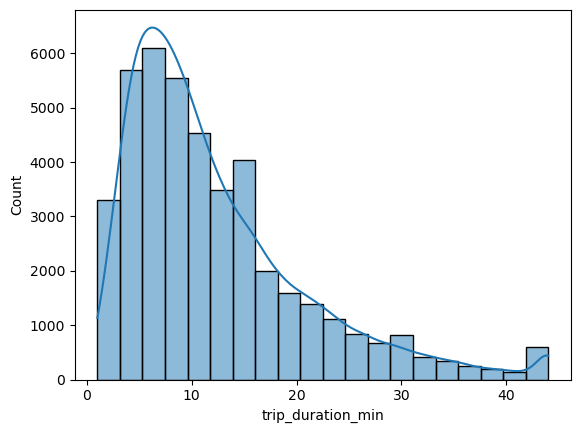

In [17]:
#Showing extreme values for trip_duration_min
sns.histplot(citibike_geo['trip_duration_min'], bins=20, kde = True)

### There is no extreme value in the trip duration length as it seems likelt for people to ride a bike for over 40 min

<Axes: xlabel='birth_year', ylabel='Count'>

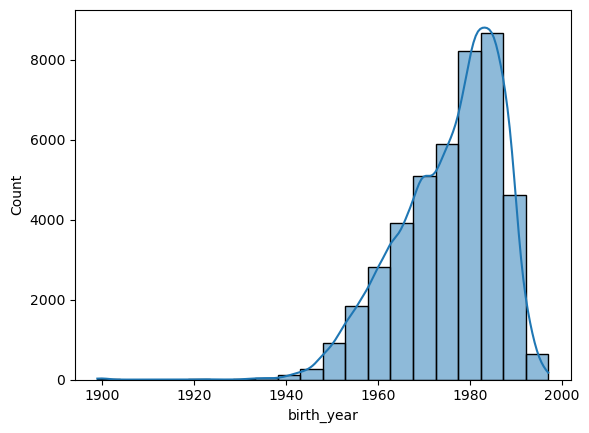

In [18]:
#Showing extreme values for birth_year
sns.histplot(citibike_geo['birth_year'], bins=20, kde = True)

In [19]:
# Check how many extreme values
citibike_geo[citibike_geo['birth_year']<1900]

,day_of_the_week,start_hour,ride_start_time,start_station_latitude,start_station_longitude,ride_end_time,end_station_latitude,end_station_longitude,subscriber,birth_year,gender,trip_duration_min
4180,Thu,7,2013-09-12 07:36:39,40.760094,-73.994618,2013-09-12 07:55:02,40.719105,-73.999733,Subscriber,1899,Male,18
8340,Sun,11,2013-09-08 11:11:35,40.760094,-73.994618,2013-09-08 11:32:02,40.719105,-73.999733,Subscriber,1899,Male,20
11171,Fri,20,2013-09-20 20:16:18,40.702515,-74.014270,2013-09-20 20:58:45,40.701221,-74.012342,Subscriber,1899,Male,42
11735,Wed,8,2013-09-11 08:40:59,40.760875,-74.002777,2013-09-11 08:59:17,40.719105,-73.999733,Subscriber,1899,Male,18
13931,Tue,18,2013-09-10 18:53:53,40.719105,-73.999733,2013-09-10 19:14:46,40.760094,-73.994618,Subscriber,1899,Male,20
32397,Thu,19,2013-09-05 19:42:45,40.708235,-74.005301,2013-09-05 20:01:32,40.728739,-74.007488,Subscriber,1899,Male,18
34298,Sun,13,2013-09-08 13:37:24,40.715338,-74.016584,2013-09-08 13:58:14,40.720434,-74.010206,Subscriber,1899,Male,20
41240,Sun,11,2013-09-22 11:20:44,40.728739,-74.007488,2013-09-22 11:33:20,40.708235,-74.005301,Subscriber,1899,Male,12


### I would say that the year 1900 is an extreme value but I also know that some people that have stayed fit in their old age are capable of riding a citibike even being 113 years old. Eliminating these values would present bias in my analysis.

In [20]:
# Create a data frame with just the states and the values for rating we want plotted
data_to_plot = citibike_geo[['start_station_latitude','start_station_longitude',
                             'end_station_latitude','end_station_longitude',
                             'trip_duration_min']]
data_to_plot.head()

,start_station_latitude,start_station_longitude,end_station_latitude,end_station_longitude,trip_duration_min
0,40.754666,-73.991382,40.742388,-73.997262,16
1,40.719392,-74.002472,40.728419,-73.987140,9
2,40.760193,-73.991255,40.768254,-73.988639,6
3,40.743156,-73.974347,40.756014,-73.967416,9
4,40.730287,-73.990765,40.726218,-73.983799,7


In [21]:
#Creating a map
m = folium.Map(location=(40.7129, -74.0060))

In [22]:
#Viewing the map
m

In [23]:
m.save("index.html")

In [24]:
#Choosing a tileset
folium.Map((40.7129, -74.0060), tiles="cartodb positron")

In [27]:
map=folium.Map(location=(40.7129, -74.0060), zoom_start=4)

for index, row in data_to_plot.iterrows():
    coords = (row['start_station_latitude'], row['start_station_longitude'])
    folium.Marker(coords).add_to(map)
map.save('Folium_map_points.html')
map

# 8. Discussing the results

### The results have indicated to me that majority citibikes rides are short distance. As we can see, the point markers are all in close proximity. This could mean than most customers use citibike in a certain radius, we can speculate that they probably use it to commute to work or other nearby places.